# General training and interpretability pipeline

In this notebook, we analyze the immune dataset of 9 batches from four human peripheral blood and bone marrow studies, with 16 annotated cell types. We apply DRVI with 128 latent dimensions to showcase the following:

- How to train DRVI
- Observe vanished dimensions
- Observe the latent space in UMAP and heatmap
- How to run the interpretability pipeline
- How to identify and check individual dimensions

## Contact

For questions and help requests, you can reach out in the [scverse discourse](https://discourse.scverse.org/).

If you found a bug, please use the [issue tracker](https://github.com/theislab/drvi/issues).

## Install

If you try DRVI on colab, next cell will install dependencies.

Please remove this part if your environment is already setup.

In [1]:
import sys

# if branch is stable, will install via pypi, else will install from source
branch = "latest"
IN_COLAB = "google.colab" in sys.modules

if IN_COLAB and branch == "stable":
    !pip install multigrate[tutorials]
elif IN_COLAB and branch != "stable":
    !pip install git+https://github.com/theislab/drvi.git#egg=drvi[tutorials]

## Imports

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import anndata as ad
import scanpy as sc

import scvi
import drvi
from pathlib import Path
from drvi.model import DRVI
from drvi.utils.misc import hvg_batch

In [4]:
print("Last run with scvi-tools version:", scvi.__version__)
print("Last run with DRVI version:", drvi.__version__)

Last run with scvi-tools version: 1.4.0.post1
Last run with DRVI version: 0.2.1


In [5]:
# Making plots prettier
sc.settings.set_figure_params(dpi=100, frameon=False)
sc.set_figure_params(dpi=100)
sc.set_figure_params(figsize=(3, 3))

from matplotlib import pyplot as plt
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.figsize"] = (3, 3)

## Config

In [6]:
# Set this to false if you already trained your model and do not like to retrain.
overwrite = False
SEED = 1  # Set to None if you don't want to set seed

# Set input output directory to load data from and store model and embeddings there
# We use tmp_io/ directory in the same place as this notebook. Update accordingly.
io_dir = Path("./tmp_io/drvi_immune_128/")
io_dir.mkdir(parents=True, exist_ok=True)
io_dir

PosixPath('tmp_io/drvi_immune_128')

## Load Data

In [7]:
%%bash -s "$io_dir"
export io_dir=$1

# Download Example Immune dataset if it does not exist
if [ ! -f $io_dir/immune_all.h5ad ]; then
  curl -L https://figshare.com/ndownloader/files/25717328 -o $io_dir/immune_all.h5ad
  echo "File downloaded successfully."
else
  echo "File already exists."
fi

File already exists.


In [8]:
adata = sc.read_h5ad(io_dir / "immune_all.h5ad")
# Remove dataset with non-count values
adata = adata[adata.obs["batch"] != "Villani"].copy()
# We shuffle the data for better visualization. Otherwise order of points in UMAP will not be random.
sc.pp.subsample(adata, fraction=1.)
adata

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    layers: 'counts'

## Pre-processing

In [9]:
adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    uns: 'log1p'
    layers: 'counts'

In [10]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
adata

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    uns: 'log1p', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [11]:
# Batch aware HVG selection (method is obtained from scIB metrics)
hvg_genes = hvg_batch(adata, batch_key="batch", target_genes=2000, adataOut=False)
adata = adata[:, hvg_genes].copy()
adata

This function is obtained from scIB metrics. Please don't forget to cite them if you use it.
Using 311 HVGs from full intersect set
Using 144 HVGs from n_batch-1 set
Using 176 HVGs from n_batch-2 set
Using 227 HVGs from n_batch-3 set
Using 305 HVGs from n_batch-4 set
Using 506 HVGs from n_batch-5 set
Using 331 HVGs from n_batch-6 set
Using 2000 HVGs


AnnData object with n_obs × n_vars = 32484 × 2000
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    uns: 'log1p', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

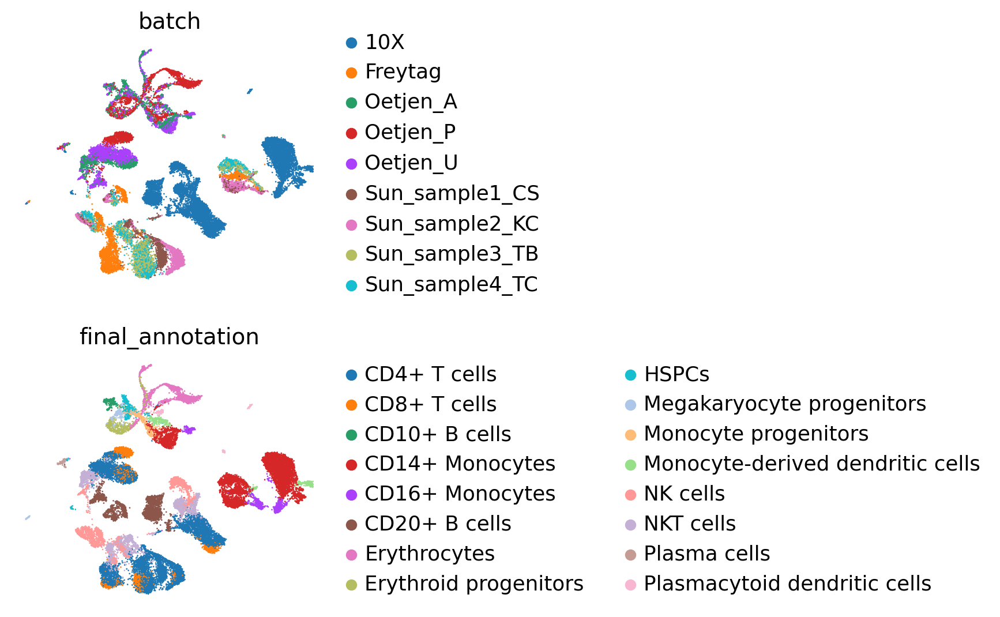

In [12]:
sc.pl.umap(adata, color=["batch", "final_annotation"], ncols=1, frameon=False)

In [13]:
# Save pre-processes data for next notebooks
if overwrite or not (io_dir / "adata_preprocesses.h5ad").exists():
    adata.write_h5ad(io_dir / "adata_preprocesses.h5ad")

## Train DRVI

In [14]:
# You can also skip this cell if model is already trained

# Setup data
DRVI.setup_anndata(
    adata,
    # DRVI accepts count data by default.
    # Do not forget to change gene_likelihood if you provide a non-count data.
    layer="counts",
    # Always provide a list. DRVI can accept multiple covariates.
    categorical_covariate_keys=["batch"],
    # DRVI accepts count data by default.
    # Set to false if you provide log-normalized data and use normal distribution (mse loss).
    is_count_data=True,
)

# Setting seed (set to None if you don't want to fix seed)
scvi.settings.seed = SEED

# construct the model
model = DRVI(
    adata,
    n_latent=128,
    # For encoder and decoder dims, provide a list of integers.
    encoder_dims=[128, 128],
    decoder_dims=[128, 128],
)
model

[rank: 0] Seed set to 1


INFO     DRVI: The model has been initialized                                                                      


DRVI 
Latent size: 128, splits: 128, pooling of splits: 'logsumexp', 
Encoder dims: [128, 128], 
Decoder dims: [128, 128], 
Gene likelihood: pnb_softmax, 

Training status: Not Trained

In [15]:
# For cpu training you should add the following line to the model.train parameters:
# accelerator="cpu", devices=1,
#
# For mps acceleration on macbooks, add the following line to the model.train parameters:
# accelerator="mps", devices=1,
#
# For gpu training don't provide any additional parameter.
# More details here: https://lightning.ai/docs/pytorch/stable/accelerators/gpu_basic.html

n_epochs = 400
model_path = io_dir / "drvi_model"

# train the model and save (if not already trained)
if overwrite or not model_path.exists():
    model.train(
        max_epochs=n_epochs,
        early_stopping=False,
        early_stopping_patience=20,
        # mps
        # accelerator="mps", devices=1,
        # cpu
        # accelerator="cpu", devices=1,
        # gpu: no additional parameter
        #
        # No need to provide `plan_kwargs` if n_epochs >= 400.
        plan_kwargs={
            "n_epochs_kl_warmup": n_epochs,
        },
    )
    
    # Save the model
    model.save(model_path, overwrite=True)

# Runtime:
# The runtime for CPU laptop (M1) is 208 minutes
# The runtime for Macbook gpu (M1) is 64 minutes
# The runtime for GPU (H100) is 10 minutes

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
You are using a CUDA device ('NVIDIA H100 80GB HBM3') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 400/400: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [10:02<00:00,  1.47s/it, v_num=1, train_loss=744]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [10:02<00:00,  1.51s/it, v_num=1, train_loss=744]


## Latent space

In [16]:
# Load the model
model = DRVI.load(model_path, adata)
model

INFO     File tmp_io/drvi_immune_128/drvi_model/model.pt already downloaded                                        
INFO     DRVI: The model is trained with DRVI version 0.2.1.                                                       
INFO     DRVI: Loading source in DRVI version 0.2.1.                                                               
INFO     DRVI: The model has been initialized                                                                      


DRVI 
Latent size: 128, splits: 128, pooling of splits: 'logsumexp', 
Encoder dims: [128, 128], 
Decoder dims: [128, 128], 
Gene likelihood: pnb_softmax, 

Training status: Trained

In [17]:
embed_path = io_dir / "embed.h5ad"

# Create latent space data in anndata format
if overwrite or not embed_path.exists():
    embed = ad.AnnData(model.get_latent_representation(), obs=adata.obs)

    # We set latent dimension stats here (see drvi.utils.pl.plot_latent_dimension_stats in next cells)
    drvi.utils.tl.set_latent_dimension_stats(model, embed, vanished_threshold=0.1)
    
    sc.pp.neighbors(embed, n_neighbors=10, use_rep="X", n_pcs=embed.X.shape[1])
    sc.tl.umap(embed, spread=1.0, min_dist=0.5, random_state=123)
    sc.pp.pca(embed)
    
    embed.write_h5ad(embed_path)

In [18]:
embed = sc.read_h5ad(embed_path)

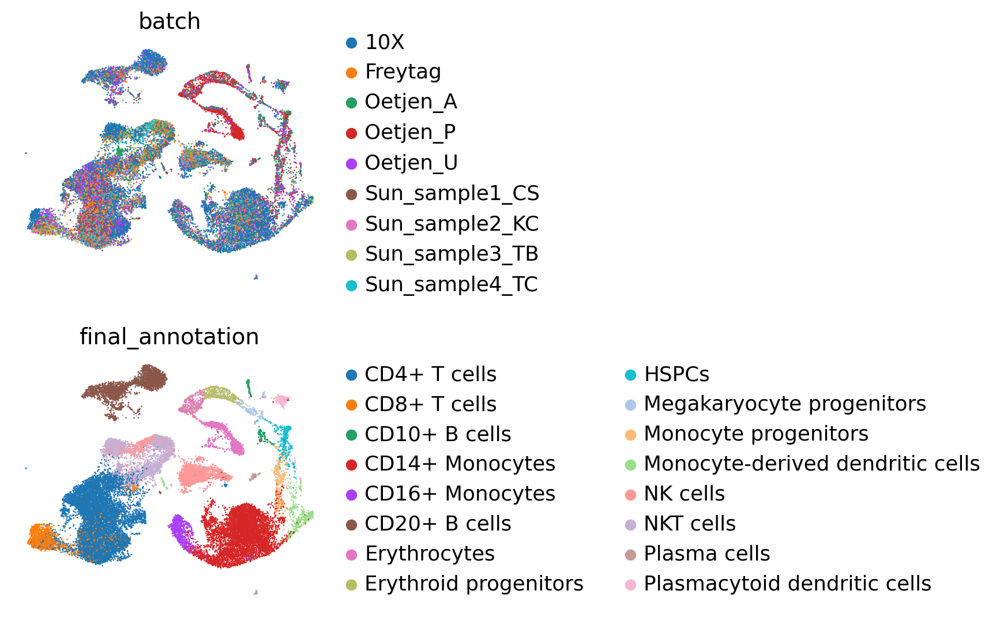

In [19]:
sc.pl.umap(embed, color=["batch", "final_annotation"], ncols=1, frameon=False)

### Chack latent dimension stats

In [20]:
# Show information for latnet factors
embed.var.sort_values("reconstruction_effect", ascending=False)[:5]

,original_dim_id,reconstruction_effect,order,max_value,mean,min,max,std,std_abs,title,vanished
22,22,33157404.0,0,2.504406,-0.165174,-2.504406,1.787719,0.928461,0.472378,DR 1,False
7,7,7928678.0,1,4.165478,0.023959,-4.165478,1.614366,0.884914,0.589884,DR 2,False
44,44,7011031.0,2,3.167037,0.018338,-3.167037,1.579996,0.869737,0.549752,DR 3,False
71,71,5698458.0,3,4.139865,-0.030023,-1.367767,4.139865,0.747217,0.609722,DR 4,False
31,31,5402001.0,4,4.540383,-0.075561,-1.598019,4.540383,0.763927,0.604845,DR 5,False


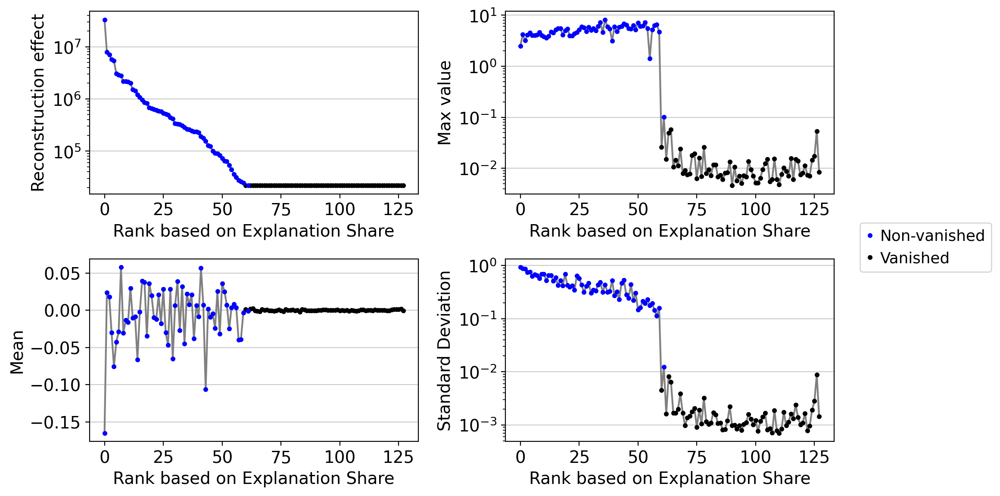

In [21]:
drvi.utils.pl.plot_latent_dimension_stats(embed, ncols=2)

You can check the same plot after removing vanished dimensions

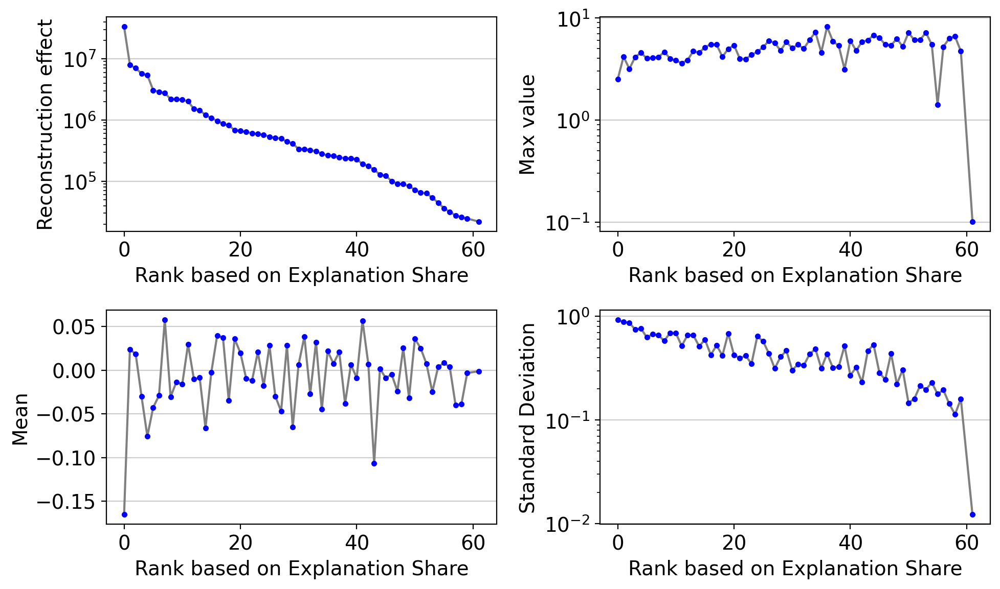

In [22]:
drvi.utils.pl.plot_latent_dimension_stats(embed, ncols=2, remove_vanished=True)

### Plot latent dimensions

By default, vanished dimensions are not plotted. Change arguments if you would like to.

#### UMAP

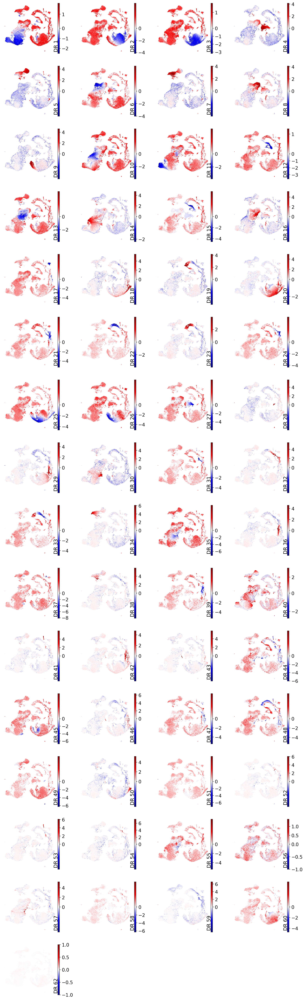

In [23]:
drvi.utils.pl.plot_latent_dims_in_umap(embed)

#### Heatmap

Heatmaps can be useful to visualize general relationship between latent dims and known categories of data

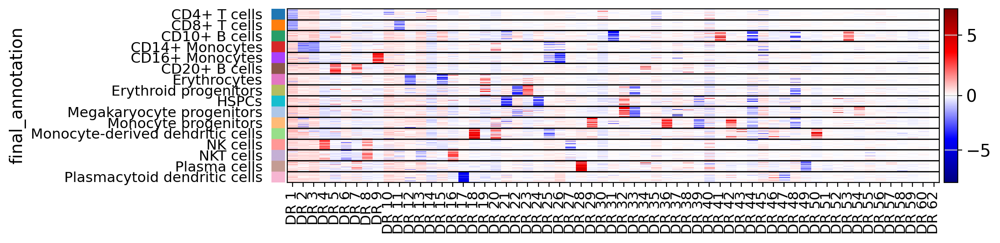

In [24]:
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "final_annotation", title_col="title")

It is possible to sort dimensions based on the top relevance with respect to a categoricals variable

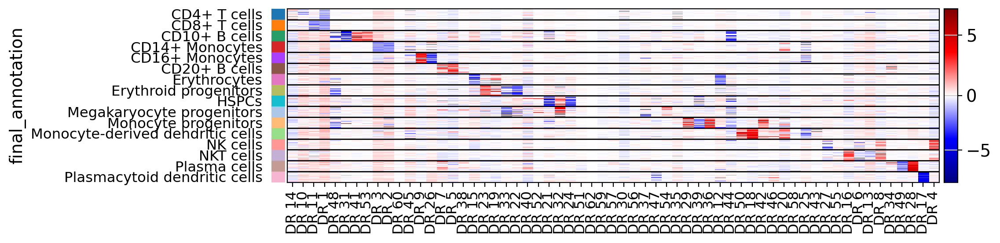

In [25]:
drvi.utils.pl.plot_latent_dims_in_heatmap(embed, "final_annotation", title_col="title", sort_by_categorical=True)

## Interpretability

### Traversing the latent space

Here we use DRVI's utils to traverse latent space and find the effect of each latent dimension

In [26]:
traverse_adata_path = io_dir / "traverse_adata.h5ad"

if overwrite or not traverse_adata_path.exists():
    traverse_adata = drvi.utils.tl.traverse_latent(model, embed, n_samples=20, max_noise_std=0.0)
    drvi.utils.tl.calculate_differential_vars(traverse_adata)
    traverse_adata.write_h5ad(traverse_adata_path)

traversing latent ...
Input latent shape: control: (51200, 128), effect: (51200, 128)
Output mean param shape: control: (51200, 2000), effect: (51200, 2000)
Finding differential variables per latent dimension ...


In [27]:
traverse_adata = sc.read_h5ad(traverse_adata_path)
traverse_adata

AnnData object with n_obs × n_vars = 51200 × 2000
    obs: 'original_order', 'dim_id', 'sample_id', 'step_id', 'span_value', 'lib_size', 'title', 'vanished', 'order'
    var: 'original_order'
    uns: 'combined_score_traverse_effect_neg_dim_ids', 'combined_score_traverse_effect_pos_dim_ids', 'combined_score_traverse_effect_stepwise', 'max_possible_traverse_effect_neg_dim_ids', 'max_possible_traverse_effect_pos_dim_ids', 'max_possible_traverse_effect_stepwise', 'min_possible_traverse_effect_neg_dim_ids', 'min_possible_traverse_effect_pos_dim_ids', 'min_possible_traverse_effect_stepwise'
    obsm: 'cat_covs', 'control_latent', 'effect_latent'
    varm: 'combined_score_traverse_effect_neg', 'combined_score_traverse_effect_pos', 'max_possible_traverse_effect_neg', 'max_possible_traverse_effect_pos', 'min_possible_traverse_effect_neg', 'min_possible_traverse_effect_pos'
    layers: 'control', 'effect'

### Getting the results

We can then visualize the top relevant genes for each dimension

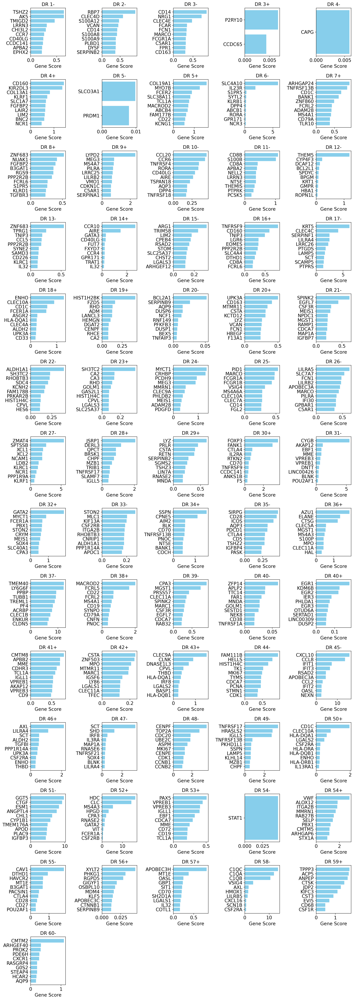

In [28]:
drvi.utils.pl.show_top_differential_vars(traverse_adata, key="combined_score", score_threshold=0.0)

In [29]:
dimensions_interpretability = drvi.utils.tools.iterate_on_top_differential_vars(
    traverse_adata, key="combined_score", score_threshold=0.0
)

# For making it brief we just iterate over 5 dimensions
for dim_title, gene_scores in dimensions_interpretability[:5]:
    print(dim_title)
    # We just print top 20
    print(gene_scores[:20])

DR 1-
index
TSHZ2      0.639211
AK5        0.639105
TMIGD2     0.461052
LRRN3      0.310039
CHI3L2     0.291687
CCR7       0.258551
CD40LG     0.242359
CCDC141    0.236156
APBA2      0.219705
EPHX2      0.216404
PCSK5      0.209354
FHIT       0.174756
INPP4B     0.171339
CD3G       0.170337
MDS2       0.138291
CAMK4      0.133031
TRAT1      0.131776
SIRPG      0.124141
ICOS       0.123789
TSPAN18    0.114518
Name: 22, dtype: float64
DR 2-
index
RBP7        0.921802
CLEC4D      0.582127
S100A12     0.470872
VCAN        0.450797
CD14        0.423104
S100A8      0.416234
S100A9      0.383211
PLBD1       0.381397
DYSF        0.378795
SERPINB2    0.369180
CDA         0.343802
AQP9        0.304086
CSTA        0.300269
QPCT        0.282242
FOLR3       0.274915
CRISPLD2    0.246873
FCN1        0.243070
CLEC4E      0.242704
FCAR        0.236564
CD93        0.225880
Name: 7, dtype: float64
DR 3-
index
CD14      0.851709
NRG1      0.721512
CLEC4E    0.477624
FCAR      0.347459
FCN1      0.337583


### Looking into individual dimensions

A user can take a deeper look into individual dimensions. we can see the min_possible, and max_possible log-fold-changes of each dimension. In addition, one can check the activity of top relevant genes for dimensions of interest.

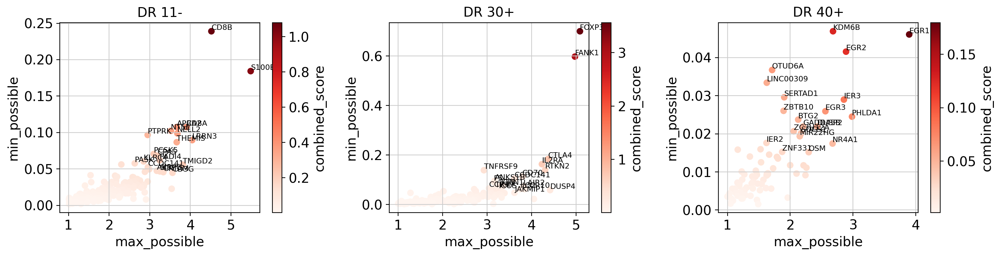

In [30]:
# We visualize 3 dimensions:
# 1. DR 13- highlighting CD8
# 2. DR 35+ highlighting Technical stress response
# 3. DR 28- highlighting T-reg cells
drvi.utils.pl.show_differential_vars_scatter_plot(
    traverse_adata,
    key_x="max_possible",
    key_y="min_possible",
    key_combined="combined_score",
    dim_subset=["DR 11-", "DR 30+", "DR 40+"],
    score_threshold=0.0,
)

DR 11-


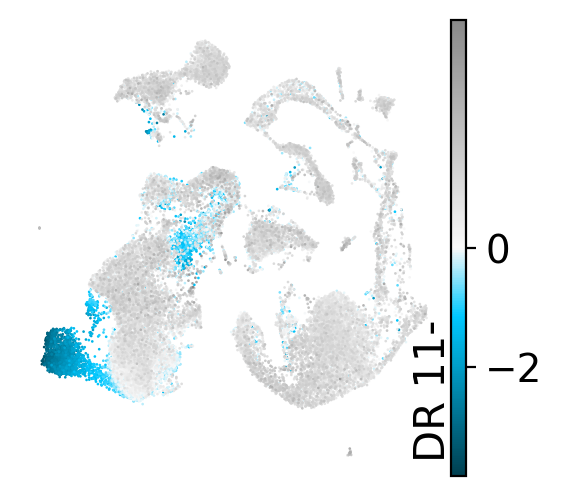

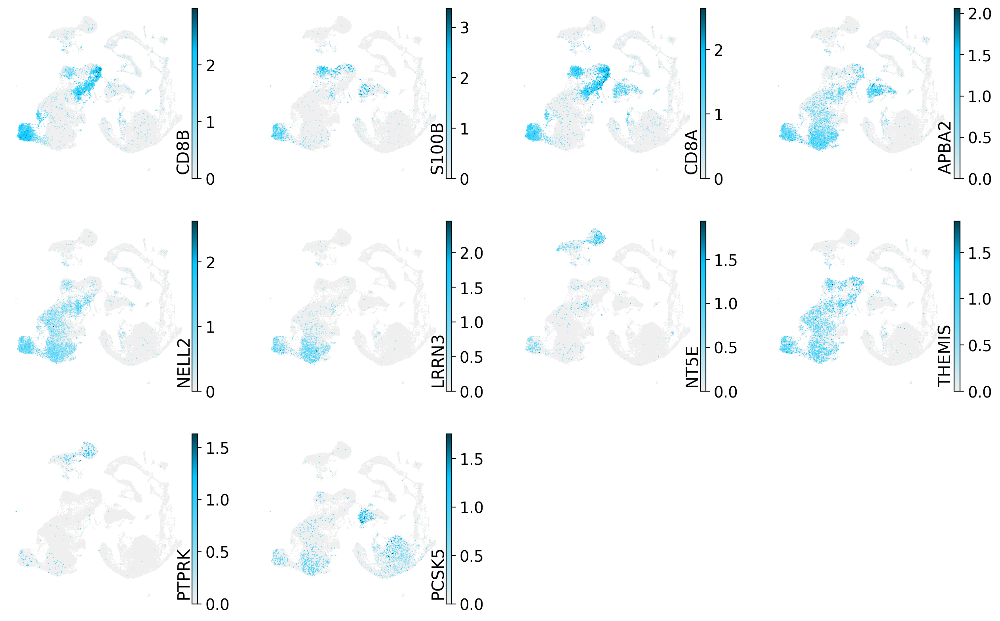

DR 30+


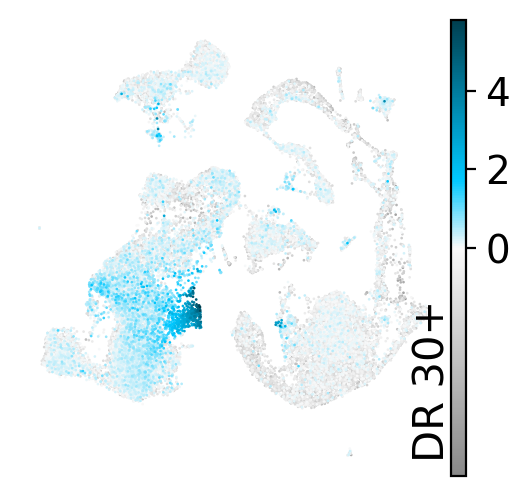

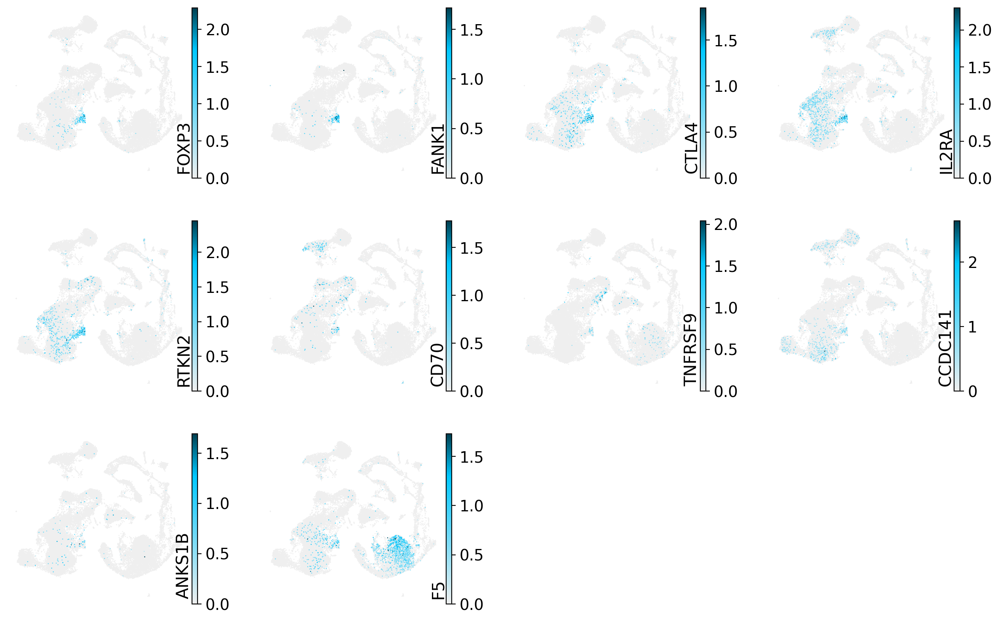

DR 40+


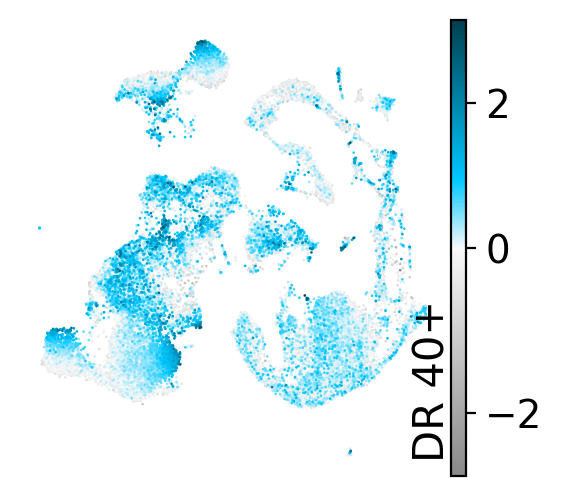

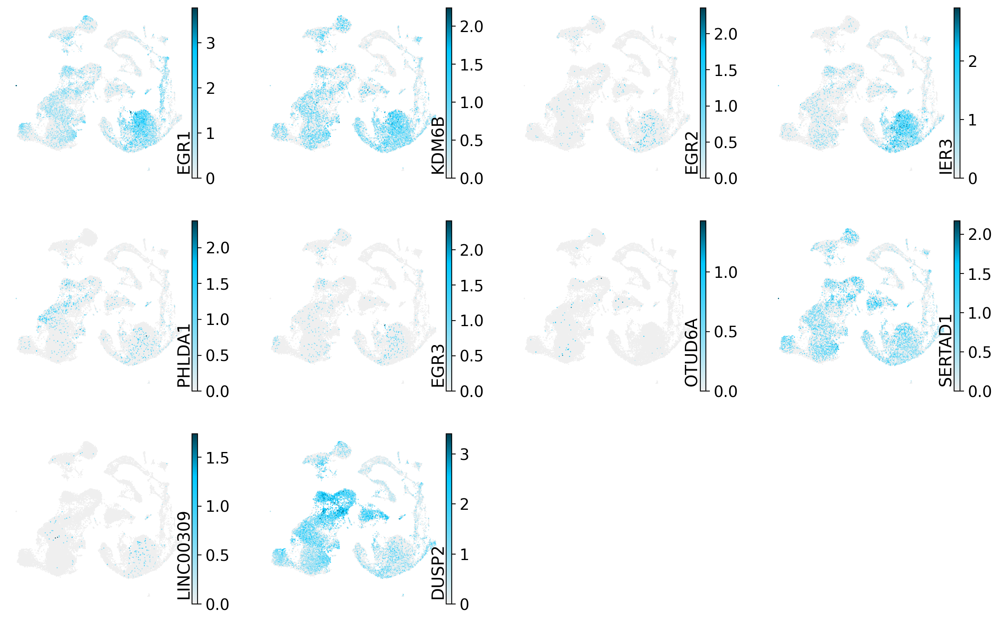

In [31]:
for fig in drvi.utils.pl.plot_relevant_genes_on_umap(
    adata,
    embed,
    traverse_adata,
    traverse_adata_key="combined_score",
    dim_subset=["DR 11-", "DR 30+", "DR 40+"],
    score_threshold=0.0,
):
    plt.show()

## Identification of programs

Once we identify the top relevant genes, we can determine some programs through supervised external information, such as:
- existing annotations
- examination by biologists
- gene-set enrichment analysis (GSEA)
- scientific literature
- automated tools based on language models

**Please refer to this tutorial for some tools that we found useful for identification of programs**

It is worth mentioning that since such supervised information is not given to the model, the quality of the derived signatures is neither affected nor biased by it. Unidentified processes with high gene scores are promising candidates for further literature search, additional analysis, and even experimental design.